# 05 — Expert Validation

Scores the current detector output (`candidates_roads.gpkg`) against user-drawn ground truth in `data/derivatives/annotations/`:
- `pads_truth.gpkg`   — polygons encapsulating old well pads
- `roads_truth.gpkg`  — lines tracing visible abandoned roads
- `wellhead_pits.gpkg` *(optional)* — point per wellhead collapse depression

**Metrics:**
- **Road recall**  — fraction of each truth road's length within tolerance of any candidate.
- **Road precision** — fraction of each candidate's length within tolerance of any truth road.
- **Pad hit rate** — fraction of truth pads with a candidate road within tolerance.
- **Pit hit rate** — fraction of truth pits with a candidate road within tolerance.

Tolerance defaults to **10 m**. Pads/pits use a looser **25 m** because roads come *near* pads, not *through* them.

In [1]:
from pathlib import Path
import numpy as np
import geopandas as gpd
import rasterio
import matplotlib.pyplot as plt
from datetime import datetime
from shapely.ops import unary_union

PROJECT = Path.cwd().parent if Path.cwd().name == 'notebooks' else Path.cwd()
DERIV = PROJECT / 'data' / 'derivatives'
ANNO  = DERIV / 'annotations'
LOGS  = PROJECT / 'docs'

TOL_LINE_M = 10.0
TOL_PAD_M  = 25.0
TOL_PIT_M  = 25.0
STEP_M     = 1.0

cand = gpd.read_file(DERIV / 'candidates' / 'candidates_roads.gpkg')
CRS = cand.crs

pads_t  = gpd.read_file(ANNO / 'pads_truth.gpkg').to_crs(CRS) if (ANNO / 'pads_truth.gpkg').exists() else None
roads_t = gpd.read_file(ANNO / 'roads_truth.gpkg').to_crs(CRS) if (ANNO / 'roads_truth.gpkg').exists() else None
pits_t  = gpd.read_file(ANNO / 'wellhead_pits.gpkg').to_crs(CRS) if (ANNO / 'wellhead_pits.gpkg').exists() else None
wells   = gpd.read_file(DERIV / 'wells_in_tile.gpkg').to_crs(CRS)

cand_union = unary_union(list(cand.geometry))  # shapely geometry for fast distance

def count(g):
    return 0 if g is None else len(g)
print(f'candidates (cyan): {len(cand)} LineStrings')
print(f'truth pads       : {count(pads_t)} polygons')
print(f'truth roads      : {count(roads_t)} lines')
print(f'truth pits       : {count(pits_t)} points')
print(f'documented wells : {len(wells)} points')

with rasterio.open(DERIV / 'hillshade.tif') as ds:
    hs = ds.read(1); T = ds.transform
H, W = hs.shape; cs = T.a; X0, Y1 = T.c, T.f
EXT = (X0, X0 + W*cs, Y1 - H*cs, Y1)

candidates (cyan): 101 LineStrings
truth pads       : 88 polygons
truth roads      : 96 lines
truth pits       : 90 points
documented wells : 107 points


## 1. Road recall — per truth line

For each user-drawn road, sample points at 1 m spacing. Count the fraction that sit within `TOL_LINE_M` of *any* candidate road.

In [2]:
def covered_fraction(truth_geom, ref_union, tol, step=STEP_M):
    if truth_geom.length < step:
        return float(truth_geom.distance(ref_union) <= tol)
    n = max(2, int(np.ceil(truth_geom.length / step)) + 1)
    s = np.linspace(0, truth_geom.length, n)
    pts = [truth_geom.interpolate(x) for x in s]
    dists = np.array([ref_union.distance(p) for p in pts])
    return float((dists <= tol).mean())

if roads_t is None or len(roads_t) == 0:
    print('no roads_truth — skipping road recall')
    road_cov = None
else:
    roads_t = roads_t.copy()
    roads_t['length_m'] = roads_t.geometry.length
    roads_t['cov_frac'] = [covered_fraction(g, cand_union, TOL_LINE_M) for g in roads_t.geometry]
    roads_t['covered_m'] = roads_t['length_m'] * roads_t['cov_frac']
    total_len = roads_t['length_m'].sum()
    total_cov = roads_t['covered_m'].sum()
    print(f'per-line coverage fraction @ {TOL_LINE_M:.0f} m tol:')
    for i, r in roads_t.iterrows():
        note = (' — ' + str(r.get('notes',''))) if r.get('notes') else ''
        print(f'  truth #{i}: length {r.length_m:6.1f} m  coverage {100*r.cov_frac:5.1f}%{note}')
    road_cov = total_cov / total_len if total_len > 0 else 0
    print(f'\nROAD RECALL (length-weighted): {100*road_cov:.1f}%  ({total_cov:.0f} of {total_len:.0f} m covered)')

per-line coverage fraction @ 10 m tol:
  truth #0: length   78.5 m  coverage   0.0%
  truth #1: length  192.5 m  coverage  39.2%
  truth #2: length  196.2 m  coverage   0.0%
  truth #3: length  429.8 m  coverage  92.3%
  truth #4: length  170.7 m  coverage   5.2%
  truth #5: length  330.4 m  coverage   0.0%
  truth #6: length   84.3 m  coverage  27.9%
  truth #7: length  162.0 m  coverage   0.0%
  truth #8: length   79.6 m  coverage   0.0%
  truth #9: length  162.3 m  coverage  23.8%
  truth #10: length  117.8 m  coverage  63.9%
  truth #11: length  258.5 m  coverage  20.4%
  truth #12: length  112.5 m  coverage   0.0%
  truth #13: length   65.5 m  coverage   0.0%
  truth #14: length  151.7 m  coverage   0.0%
  truth #15: length   47.9 m  coverage   0.0%
  truth #16: length  506.6 m  coverage   0.0%
  truth #17: length  822.7 m  coverage   0.0%
  truth #18: length  320.2 m  coverage   0.0%
  truth #19: length   56.7 m  coverage   0.0%
  truth #20: length  137.4 m  coverage   0.0%
  tru

## 2. Road precision — per candidate line

For each candidate road, the fraction of its length within tolerance of *any* truth road. Low precision means the candidate is detecting something that isn't a road by your eyes.

In [3]:
if roads_t is None or len(roads_t) == 0:
    road_prec = None
    print('no roads_truth — skipping precision')
else:
    truth_union = unary_union(list(roads_t.geometry))
    cand = cand.copy()
    cand['cov_frac_truth'] = [covered_fraction(g, truth_union, TOL_LINE_M) for g in cand.geometry]
    cand['covered_m'] = cand['length_m'] * cand['cov_frac_truth']
    # note: your truth subset doesn't cover the whole tile. Low precision may reflect coverage gaps in your labels, not bad detections.
    total_cand_len = cand['length_m'].sum()
    total_cand_match = cand['covered_m'].sum()
    road_prec = total_cand_match / total_cand_len if total_cand_len > 0 else 0
    print(f'ROAD PRECISION (length-weighted, only honest for labelled areas): {100*road_prec:.1f}%')
    print(f'  {total_cand_match:.0f} of {total_cand_len:.0f} candidate metres fall within {TOL_LINE_M:.0f} m of a truth road')
    # Per-candidate distribution
    import pandas as pd
    bins = [0, 0.25, 0.5, 0.75, 1.0001]
    labels = ['0-25%', '25-50%', '50-75%', '75-100%']
    cand['prec_bucket'] = pd.cut(cand['cov_frac_truth'], bins=bins, labels=labels, include_lowest=True)
    print('\ncandidate distribution by truth-coverage bucket:')
    print(cand['prec_bucket'].value_counts().sort_index().to_string())

ROAD PRECISION (length-weighted, only honest for labelled areas): 52.8%
  5704 of 10796 candidate metres fall within 10 m of a truth road

candidate distribution by truth-coverage bucket:
prec_bucket
0-25%      83
25-50%      2
50-75%      4
75-100%    12


## 3. Pad hit rate — each truth pad vs nearest candidate road

A pad 'counts as hit' if a candidate road comes within `TOL_PAD_M` of its boundary. This captures the **road leads to pad** signature — pads aren't roads themselves, but access roads should terminate near (or cross) every pad.

In [4]:
if pads_t is None or len(pads_t) == 0:
    pad_hit_rate = None
    print('no pads_truth — skipping')
else:
    pads_t = pads_t.copy()
    pads_t['nearest_cand_m'] = [g.distance(cand_union) for g in pads_t.geometry]
    pads_t['hit'] = pads_t['nearest_cand_m'] <= TOL_PAD_M
    pads_t['area_m2'] = pads_t.geometry.area
    print('per-pad distance to nearest candidate road:')
    for i, p in pads_t.iterrows():
        flag = 'HIT' if p['hit'] else 'miss'
        note = (' — ' + str(p.get('notes',''))) if p.get('notes') else ''
        print(f'  pad #{i}: area {p.area_m2:6.0f} m²  nearest road {p.nearest_cand_m:6.1f} m  [{flag}]{note}')
    pad_hit_rate = float(pads_t['hit'].mean())
    print(f'\nPAD HIT RATE @ {TOL_PAD_M:.0f} m: {100*pad_hit_rate:.1f}%  ({int(pads_t.hit.sum())} / {len(pads_t)})')
    print(f'median pad→nearest-road: {pads_t.nearest_cand_m.median():.1f} m')

per-pad distance to nearest candidate road:
  pad #0: area   2809 m²  nearest road    0.0 m  [HIT]
  pad #1: area   1359 m²  nearest road    9.6 m  [HIT]
  pad #2: area   1178 m²  nearest road   81.1 m  [miss]
  pad #3: area   1472 m²  nearest road   37.5 m  [miss]
  pad #4: area    931 m²  nearest road    0.0 m  [HIT]
  pad #5: area   1734 m²  nearest road   10.4 m  [HIT]
  pad #6: area   2513 m²  nearest road   45.3 m  [miss]
  pad #7: area   1224 m²  nearest road    2.2 m  [HIT]
  pad #8: area   1833 m²  nearest road   28.8 m  [miss]
  pad #9: area   1501 m²  nearest road    0.0 m  [HIT]
  pad #10: area   2208 m²  nearest road    0.9 m  [HIT]
  pad #11: area   2209 m²  nearest road  127.1 m  [miss]
  pad #12: area   1436 m²  nearest road  120.9 m  [miss]
  pad #13: area   2279 m²  nearest road  181.0 m  [miss]
  pad #14: area   2291 m²  nearest road    0.0 m  [HIT]
  pad #15: area   2250 m²  nearest road   55.9 m  [miss]
  pad #16: area   1915 m²  nearest road   88.1 m  [miss]
  pad

## 4. Pit hit rate — each truth pit vs nearest candidate road

Pits are often more precisely locatable than pads (they're small, circular). If roads genuinely lead to wellheads, most pits should have a candidate within `TOL_PIT_M`.

In [5]:
if pits_t is None or len(pits_t) == 0:
    pit_hit_rate = None
    print('no wellhead_pits — skipping')
else:
    pits_t = pits_t.copy()
    pits_t['nearest_cand_m'] = [g.distance(cand_union) for g in pits_t.geometry]
    pits_t['hit'] = pits_t['nearest_cand_m'] <= TOL_PIT_M
    # Distance to nearest DOCUMENTED well — sanity check on how sloppy the CSV GPS is
    wells_union = unary_union(list(wells.geometry))
    pits_t['nearest_well_m'] = [g.distance(wells_union) for g in pits_t.geometry]
    pit_hit_rate = float(pits_t['hit'].mean())
    print(f'PIT HIT RATE @ {TOL_PIT_M:.0f} m: {100*pit_hit_rate:.1f}%  ({int(pits_t.hit.sum())} / {len(pits_t)})')
    print(f'median pit→nearest-road:  {pits_t.nearest_cand_m.median():.1f} m')
    print(f'median pit→nearest-DEP-well-record: {pits_t.nearest_well_m.median():.1f} m  (GPS accuracy proxy)')

PIT HIT RATE @ 25 m: 28.9%  (26 / 90)
median pit→nearest-road:  41.6 m
median pit→nearest-DEP-well-record: 15.7 m  (GPS accuracy proxy)


## 5. Overview map — hits and misses on the hillshade

C:\Users\colto\AppData\Local\Temp\ipykernel_38804\3371319066.py:27: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend(loc='lower left', fontsize=10, framealpha=0.9)


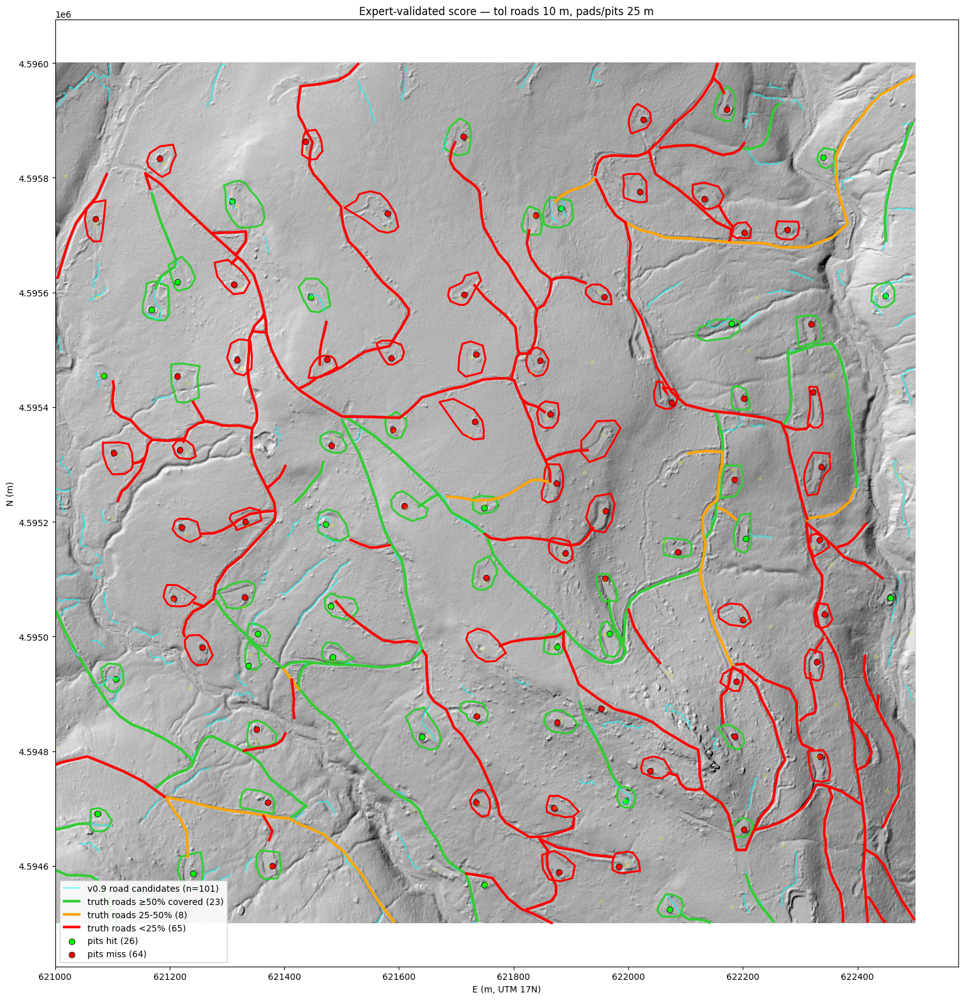

In [6]:
fig, ax = plt.subplots(figsize=(16, 16))
ax.imshow(hs, cmap='gray', extent=EXT, origin='upper')
# candidates
cand.plot(ax=ax, color='cyan', linewidth=1.2, alpha=0.7, label=f'v0.9 road candidates (n={len(cand)})')
# truth roads: green if covered, red if missed (per-line coverage threshold 0.25)
if roads_t is not None and len(roads_t) > 0:
    good = roads_t[roads_t['cov_frac'] >= 0.5]
    meh  = roads_t[(roads_t['cov_frac'] < 0.5) & (roads_t['cov_frac'] >= 0.25)]
    miss = roads_t[roads_t['cov_frac'] < 0.25]
    if len(good): good.plot(ax=ax, color='limegreen',  linewidth=3.0, label=f'truth roads ≥50% covered ({len(good)})')
    if len(meh):  meh.plot(ax=ax,  color='orange',     linewidth=3.0, label=f'truth roads 25-50% ({len(meh)})')
    if len(miss): miss.plot(ax=ax, color='red',        linewidth=3.0, label=f'truth roads <25% ({len(miss)})')
# truth pads: green hit, red miss
if pads_t is not None and len(pads_t) > 0:
    pads_t[pads_t.hit].plot(ax=ax,  facecolor='none', edgecolor='limegreen', linewidth=2.2, label=f'pads hit ({int(pads_t.hit.sum())})')
    pads_t[~pads_t.hit].plot(ax=ax, facecolor='none', edgecolor='red',       linewidth=2.2, label=f'pads miss ({int((~pads_t.hit).sum())})')
# truth pits: green hit, red miss
if pits_t is not None and len(pits_t) > 0:
    ax.scatter(pits_t[pits_t.hit].geometry.x,  pits_t[pits_t.hit].geometry.y,
               s=45, facecolor='lime', edgecolor='black', linewidths=0.6, label=f'pits hit ({int(pits_t.hit.sum())})')
    ax.scatter(pits_t[~pits_t.hit].geometry.x, pits_t[~pits_t.hit].geometry.y,
               s=45, facecolor='red',  edgecolor='black', linewidths=0.6, label=f'pits miss ({int((~pits_t.hit).sum())})')
# documented wells in background
ax.scatter(wells.geometry.x, wells.geometry.y, s=10, facecolor='none', edgecolor='yellow', linewidths=0.6, alpha=0.6)

ax.set_title(f'Expert-validated score — tol roads {TOL_LINE_M:.0f} m, pads/pits {TOL_PAD_M:.0f} m')
ax.legend(loc='lower left', fontsize=10, framealpha=0.9)
ax.set_xlabel('E (m, UTM 17N)'); ax.set_ylabel('N (m)')
plt.tight_layout()
plt.savefig(DERIV / 'expert_validation_overview.png', dpi=140, bbox_inches='tight')
plt.show()

## 6. Per-truth-feature zoom-ins (misses only)

Grid of small panels, one per missed pad and per missed road, so we can see *what kind of feature* the algorithm isn't catching.

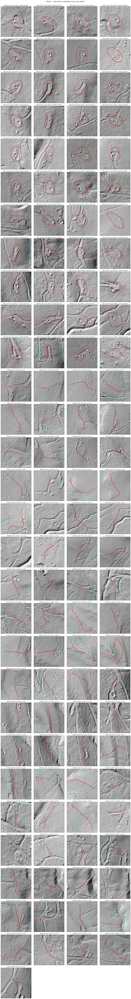

In [7]:
def _extent_for(geom, pad_m=30):
    minx, miny, maxx, maxy = geom.bounds
    cx, cy = (minx+maxx)/2, (miny+maxy)/2
    half = max(maxx-minx, maxy-miny)/2 + pad_m
    return (cx-half, cx+half, cy-half, cy+half)

def _window(hs, T, cx, cy, half):
    c0 = int(max(0, np.floor((cx-half - T.c)/T.a)))
    c1 = int(min(W, np.ceil((cx+half - T.c)/T.a)))
    r0 = int(max(0, np.floor((T.f - (cy+half))/(-T.e))))
    r1 = int(min(H, np.ceil((T.f  - (cy-half))/(-T.e))))
    return hs[r0:r1, c0:c1]

panels = []
if pads_t is not None:
    for i, p in pads_t[~pads_t.hit].iterrows():
        panels.append(('pad-miss', i, p.geometry, {'area_m2': p.area_m2, 'nearest_m': p.nearest_cand_m}))
if roads_t is not None:
    for i, r in roads_t[roads_t.cov_frac < 0.5].iterrows():
        panels.append(('road-miss', i, r.geometry, {'length_m': r.length_m, 'cov_frac': r.cov_frac}))

if not panels:
    print('no misses above threshold — nothing to plot')
else:
    n = len(panels); cols = 4; rows_ = int(np.ceil(n/cols))
    fig, axes = plt.subplots(rows_, cols, figsize=(4*cols, 4*rows_))
    axes = np.atleast_2d(axes)
    for k in range(rows_*cols):
        ax = axes.flat[k]
        if k >= n: ax.set_visible(False); continue
        kind, idx, geom, info = panels[k]
        ex = _extent_for(geom, 30)
        cx, cy = (ex[0]+ex[1])/2, (ex[2]+ex[3])/2
        half = (ex[1]-ex[0])/2
        w = _window(hs, T, cx, cy, half)
        ax.imshow(w, cmap='gray', extent=ex, origin='upper')
        # truth feature in red
        if kind == 'pad-miss':
            gpd.GeoSeries([geom], crs=CRS).plot(ax=ax, facecolor='none', edgecolor='red', linewidth=2.0)
            title = f'PAD miss #{idx}  area={info["area_m2"]:.0f}m²  nearest road {info["nearest_m"]:.0f}m'
        else:
            gpd.GeoSeries([geom], crs=CRS).plot(ax=ax, color='red', linewidth=2.0)
            title = f'ROAD miss #{idx}  len={info["length_m"]:.0f}m  cov {100*info["cov_frac"]:.0f}%'
        # candidate roads in cyan (in the window)
        cand_in = cand.cx[ex[0]:ex[1], ex[2]:ex[3]]
        if len(cand_in) > 0:
            cand_in.plot(ax=ax, color='cyan', linewidth=1.4, alpha=0.9)
        # pits if any
        if pits_t is not None:
            pits_in = pits_t.cx[ex[0]:ex[1], ex[2]:ex[3]]
            if len(pits_in) > 0:
                ax.scatter(pits_in.geometry.x, pits_in.geometry.y, s=20, facecolor='yellow', edgecolor='black', linewidths=0.4)
        ax.set_title(title, fontsize=9)
        ax.set_xlim(ex[0], ex[1]); ax.set_ylim(ex[2], ex[3])
        ax.set_xticks([]); ax.set_yticks([])
    plt.suptitle(f'Misses — truth (red) vs candidates (cyan), pits (yellow)', y=1.00)
    plt.tight_layout()
    plt.savefig(DERIV / 'expert_validation_misses.png', dpi=130, bbox_inches='tight')
    plt.show()

## 7. Summary + append to analysis log

In [8]:
stamp = datetime.utcnow().strftime('%Y-%m-%d %H:%M UTC')
lines = [f'\n## {stamp} — Expert-validation scoring (05_expert_validation)\n']
lines.append(f'- Source: `candidates_roads.gpkg` ({len(cand)} LineStrings) vs expert annotations.')
lines.append(f'- Tolerances: road-line {TOL_LINE_M:.0f} m, pad/pit {TOL_PAD_M:.0f} m.')
if road_cov is not None:
    lines.append(f'- **Road recall (length-weighted):** {100*road_cov:.1f}%  ({roads_t["covered_m"].sum():.0f} / {roads_t["length_m"].sum():.0f} m of truth covered)')
if road_prec is not None:
    lines.append(f'- Road precision (length-weighted, labelled areas only): {100*road_prec:.1f}%')
if pad_hit_rate is not None:
    lines.append(f'- **Pad hit rate:** {100*pad_hit_rate:.1f}%  ({int(pads_t.hit.sum())}/{len(pads_t)} pads ≤{TOL_PAD_M:.0f} m from a candidate)  median dist {pads_t.nearest_cand_m.median():.1f} m')
if pit_hit_rate is not None:
    lines.append(f'- **Pit hit rate:** {100*pit_hit_rate:.1f}%  ({int(pits_t.hit.sum())}/{len(pits_t)} pits ≤{TOL_PIT_M:.0f} m from a candidate)  median dist {pits_t.nearest_cand_m.median():.1f} m')
    lines.append(f'- Median pit → nearest DEP-well-record: {pits_t.nearest_well_m.median():.1f} m (GPS-accuracy sanity check)')
lines.append(f'- Images: expert_validation_overview.png, expert_validation_misses.png')
entry = '\n'.join(lines) + '\n'
with open(LOGS / 'analysis_log.md', 'a', encoding='utf-8') as f:
    f.write(entry)
print(entry)


## 2026-04-15 03:25 UTC — Expert-validation scoring (05_expert_validation)

- Source: `candidates_roads.gpkg` (101 LineStrings) vs expert annotations.
- Tolerances: road-line 10 m, pad/pit 25 m.
- **Road recall (length-weighted):** 29.0%  (5609 / 19315 m of truth covered)
- Road precision (length-weighted, labelled areas only): 52.8%
- **Pad hit rate:** 50.0%  (44/88 pads ≤25 m from a candidate)  median dist 26.0 m
- **Pit hit rate:** 28.9%  (26/90 pits ≤25 m from a candidate)  median dist 41.6 m
- Median pit → nearest DEP-well-record: 15.7 m (GPS-accuracy sanity check)
- Images: expert_validation_overview.png, expert_validation_misses.png



C:\Users\colto\AppData\Local\Temp\ipykernel_38804\3861216104.py:1: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  stamp = datetime.utcnow().strftime('%Y-%m-%d %H:%M UTC')
